In [1]:
from sklearn import linear_model
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import time
%matplotlib inline

In [19]:
# 폰트설정 (맥)
from matplotlib import font_manager
plt.rcParams["font.family"] = 'NanumGothicCoding'
from matplotlib import rc
rc('font', family="Arial Unicode MS")

In [20]:
# 폰트 설정 (윈도우)
from matplotlib import rc

rc('font', family='Malgun Gothic')

# Data 불러오기

## 부동산(Train) Data

 <img src="./datas/data_source.png" style="width:100%;">

 <img src="./datas/csv.png" style="width:100%;">

In [21]:
train = pd.read_csv('datas/train.csv')

In [22]:
train['P/m^2'] = train['transaction_real_price']/train['exclusive_use_area'] # 평당가격 column 추가

In [23]:
train['year'] =  round(train['transaction_year_month'] / 100)
train['month'] = train['transaction_year_month'] % 100

In [24]:
train = train[['transaction_id', 'apartment_id', 'city',  'dong', 'jibun', 'apt',
               'addr_kr', 'exclusive_use_area', 'year_of_completion',
               'transaction_year_month','year', 'month', 'transaction_date', 'floor', 'P/m^2',
               'transaction_real_price']]

In [25]:
train.head()

,transaction_id,apartment_id,city,dong,jibun,apt,addr_kr,exclusive_use_area,year_of_completion,transaction_year_month,year,month,transaction_date,floor,P/m^2,transaction_real_price
0,0,7622,서울특별시,신교동,6-13,신현(101동),신교동 6-13 신현(101동),84.82,2002,200801,2008.0,1,21~31,2,442.112709,37500
1,1,5399,서울특별시,필운동,142,사직파크맨션,필운동 142 사직파크맨션,99.17,1973,200801,2008.0,1,1~10,6,201.673893,20000
2,2,3578,서울특별시,필운동,174-1,두레엘리시안,필운동 174-1 두레엘리시안,84.74,2007,200801,2008.0,1,1~10,6,454.330895,38500
3,3,10957,서울특별시,내수동,95,파크팰리스,내수동 95 파크팰리스,146.39,2003,200801,2008.0,1,11~20,15,806.065988,118000
4,4,10639,서울특별시,내수동,110-15,킹스매너,내수동 110-15 킹스매너,194.43,2004,200801,2008.0,1,21~31,3,617.188705,120000


In [26]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1216553 entries, 0 to 1216552
Data columns (total 16 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   transaction_id          1216553 non-null  int64  
 1   apartment_id            1216553 non-null  int64  
 2   city                    1216553 non-null  object 
 3   dong                    1216553 non-null  object 
 4   jibun                   1216553 non-null  object 
 5   apt                     1216553 non-null  object 
 6   addr_kr                 1216553 non-null  object 
 7   exclusive_use_area      1216553 non-null  float64
 8   year_of_completion      1216553 non-null  int64  
 9   transaction_year_month  1216553 non-null  int64  
 10  year                    1216553 non-null  float64
 11  month                   1216553 non-null  int64  
 12  transaction_date        1216553 non-null  object 
 13  floor                   1216553 non-null  int64  
 14  P/

## 공원 Data

In [27]:
park = pd.read_csv('datas/park.csv')
park.tail(50)

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
1309,부산광역시,사상구,모라동,모라벤처타워공원,소공원,735.8,NaN,NaN,NaN,NaN,평의자 외 2종 12점,2012.0,2019-03-21
1310,부산광역시,사상구,주례동,주감공원,소공원,1250.0,NaN,NaN,NaN,NaN,파고라 외 4종 7점,2013.0,2019-03-21
1311,부산광역시,사상구,덕포동,문화공원,문화공원,3160.0,NaN,NaN,NaN,NaN,NaN,2017.0,2019-03-21
1312,서울특별시,구로구,신도림동,미래사랑어린이공원,어린이공원,5870.0,체력단련시설 5점,조합놀이 1기,NaN,NaN,NaN,2004.0,2019-02-25
1313,서울특별시,구로구,신도림동,신도림역문화공원,문화공원,3322.0,NaN,NaN,NaN,NaN,NaN,2006.0,2019-02-25
1314,서울특별시,구로구,신도림동,신도림어린이공원,어린이공원,2292.0,체력단련시설 6점,모래밭 1기,NaN,NaN,NaN,2000.0,2019-02-25
1315,서울특별시,구로구,구로동,희망어린이공원,어린이공원,911.0,체력단련시설 3점,"그네 1기, 조합놀이 1기",NaN,NaN,NaN,1965.0,2019-02-25
1316,서울특별시,구로구,구로동,꿈마을어린이공원,어린이공원,1609.0,체력단련시설 6점,"모래밭 1기, 시소1기, 조합놀이 1기",NaN,NaN,NaN,1970.0,2019-02-25
1317,서울특별시,구로구,구로동,구로리어린이공원,어린이공원,7782.0,체력단련시설 9점,"그네 1기, 모래밭 1기, 시소 2기, 조합놀이 1기",NaN,NaN,NaN,1977.0,2019-02-25
1318,서울특별시,구로구,구로동,솔길어린이공원,어린이공원,1999.0,체력단련시설 5점,"그네 1기, 모래밭 1기, 조합놀이 2기",NaN,NaN,NaN,1981.0,2019-02-25


In [28]:
park.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1359 entries, 0 to 1358
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   city                         1359 non-null   object 
 1   gu                           1356 non-null   object 
 2   dong                         1359 non-null   object 
 3   park_name                    1359 non-null   object 
 4   park_type                    1359 non-null   object 
 5   park_area                    1359 non-null   float64
 6   park_exercise_facility       277 non-null    object 
 7   park_entertainment_facility  435 non-null    object 
 8   park_benefit_facility        266 non-null    object 
 9   park_cultural_facitiy        72 non-null     object 
 10  park_facility_other          175 non-null    object 
 11  park_open_year               937 non-null    float64
 12  reference_date               1359 non-null   object 
dtypes: float64(2), obj

## 어린이집 Data

In [29]:
day_care = pd.read_csv('datas/day_care_center.csv')
day_care.tail()

,city,gu,day_care_name,day_care_type,day_care_baby_num,teacher_num,nursing_room_num,playground_num,CCTV_num,is_commuting_vehicle,reference_date
7546,부산광역시,금정구,해바라기어린이집,민간,46,13.0,NaN,NaN,NaN,y,2019-01-21
7547,부산광역시,금정구,해수어린이집,가정,19,6.0,NaN,NaN,NaN,y,2019-01-21
7548,부산광역시,금정구,행복한그림동산어린이집,민간,92,16.0,NaN,NaN,NaN,y,2019-01-21
7549,부산광역시,금정구,행복한어린이집,민간,43,12.0,NaN,NaN,NaN,y,2019-01-21
7550,부산광역시,금정구,혜인어린이집,민간,32,7.0,NaN,NaN,NaN,y,2019-01-21


In [30]:
day_care.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7551 entries, 0 to 7550
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   city                  7551 non-null   object 
 1   gu                    7551 non-null   object 
 2   day_care_name         7551 non-null   object 
 3   day_care_type         7551 non-null   object 
 4   day_care_baby_num     7551 non-null   int64  
 5   teacher_num           7326 non-null   float64
 6   nursing_room_num      4352 non-null   float64
 7   playground_num        3626 non-null   float64
 8   CCTV_num              5280 non-null   float64
 9   is_commuting_vehicle  7055 non-null   object 
 10  reference_date        7551 non-null   object 
dtypes: float64(4), int64(1), object(6)
memory usage: 649.0+ KB


## 동별 실가격 정보 내림차순으로 정렬

In [31]:
df1 = pd.DataFrame(train, columns=['city', 'dong', 'transaction_real_price','transaction_id','apartment_id','jibun',
                                  'apt','addr_kr', 'exclusive_use_area', 'year_of_completion', 'transaction_year_month',
                                   'year','month','transaction_date', 'floor', 'P/m^2'])

In [32]:
city_dong_data = df1["transaction_real_price"].groupby([df1['city'], df1['dong']]).agg(['count'])
price_city_dong_data = df1["transaction_real_price"].groupby([df1['city'], df1['dong']]).agg(['mean'])

city_dong_data_sort = ((city_dong_data['count'].sort_values(ascending=False)).reset_index()).head(20)
price_city_dong_data_sort = ((price_city_dong_data['mean'].sort_values(ascending=False)).reset_index()).head(20)

/Users/ijiyeong/opt/anaconda3/envs/jiyoung/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 49345 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/ijiyeong/opt/anaconda3/envs/jiyoung/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 44228 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/ijiyeong/opt/anaconda3/envs/jiyoung/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 46041 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/ijiyeong/opt/anaconda3/envs/jiyoung/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 51340 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/ijiyeong/opt/anaconda3/envs/jiyoung/lib/python3.7/site-packages/matplotlib/backends/backend_agg.py:240: RuntimeWarning: Glyph 54868 missing from current font.
  font.set_text(s, 0.0

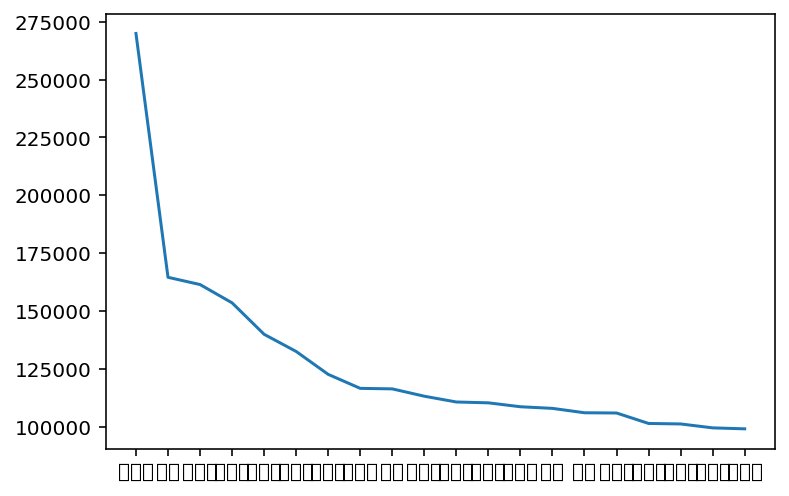

In [33]:
plt.plot(city_dong_data_sort['dong'], price_city_dong_data_sort['mean'])

findfont: Font family ['Malgun Gothic'] not found. Falling back to DejaVu Sans.


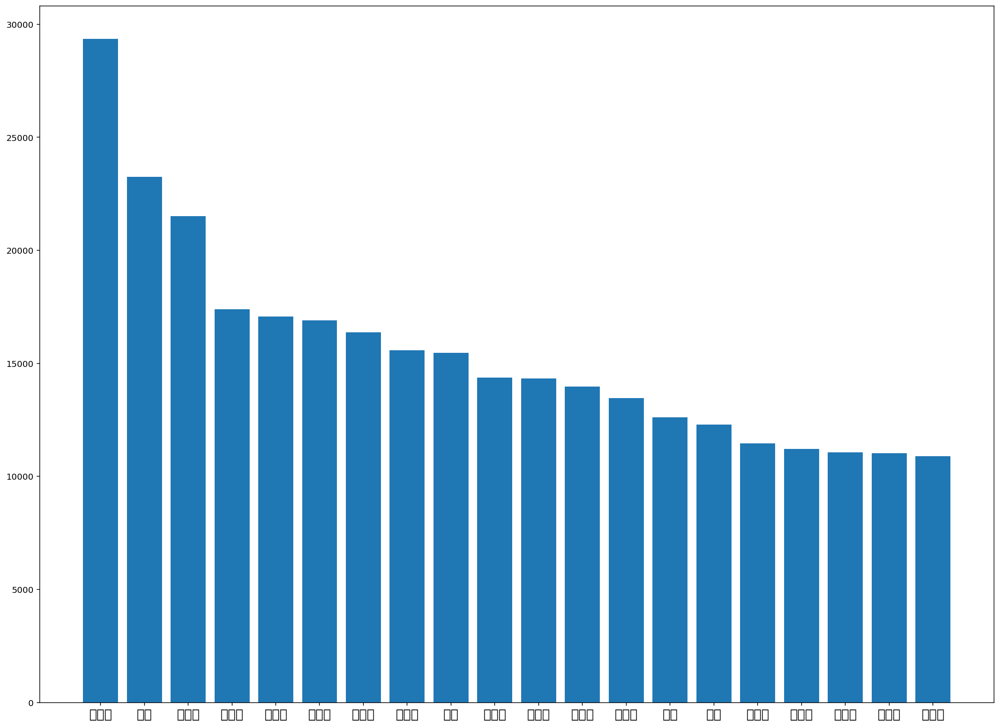

In [18]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

plt.xticks(fontsize=15)
plt.bar(city_dong_data_sort['dong'], city_dong_data_sort['count'])
#plt.plot(city_dong_data_sort['dong'], price_city_dong_data_sort['mean'])
plt.xticks(fontsize=15)
plt.show()

In [21]:
# 서울과, 부산 Data에서 거래량을 count해 sort_value를 해본 상태이다.
# 좌측부터 순서대로 상계동, 좌동, 화명동, 용호동, 중계동 순으로 거래량이 Counting 된 모습을 볼 수 있다.

## Heatmap을 이용해 상관관계 분석

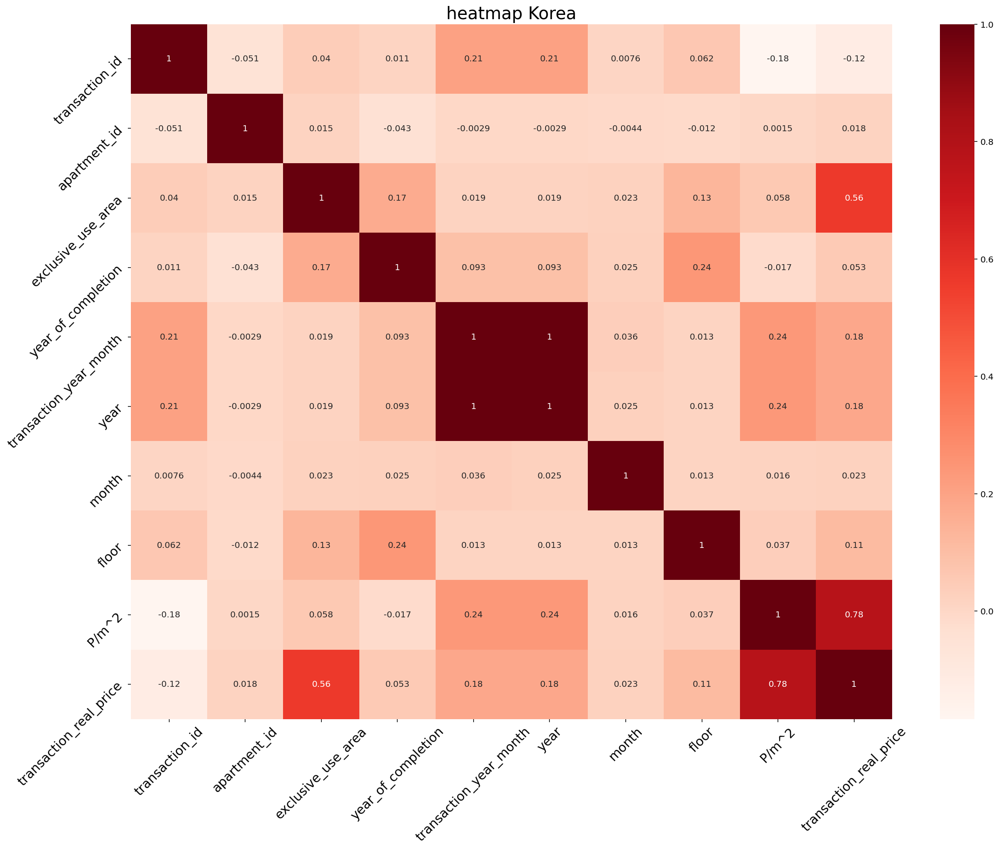

In [35]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

sns.heatmap(train.corr(), cmap="Reds", annot=True)
plt.title('heatmap Korea', fontsize=20)
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.show()

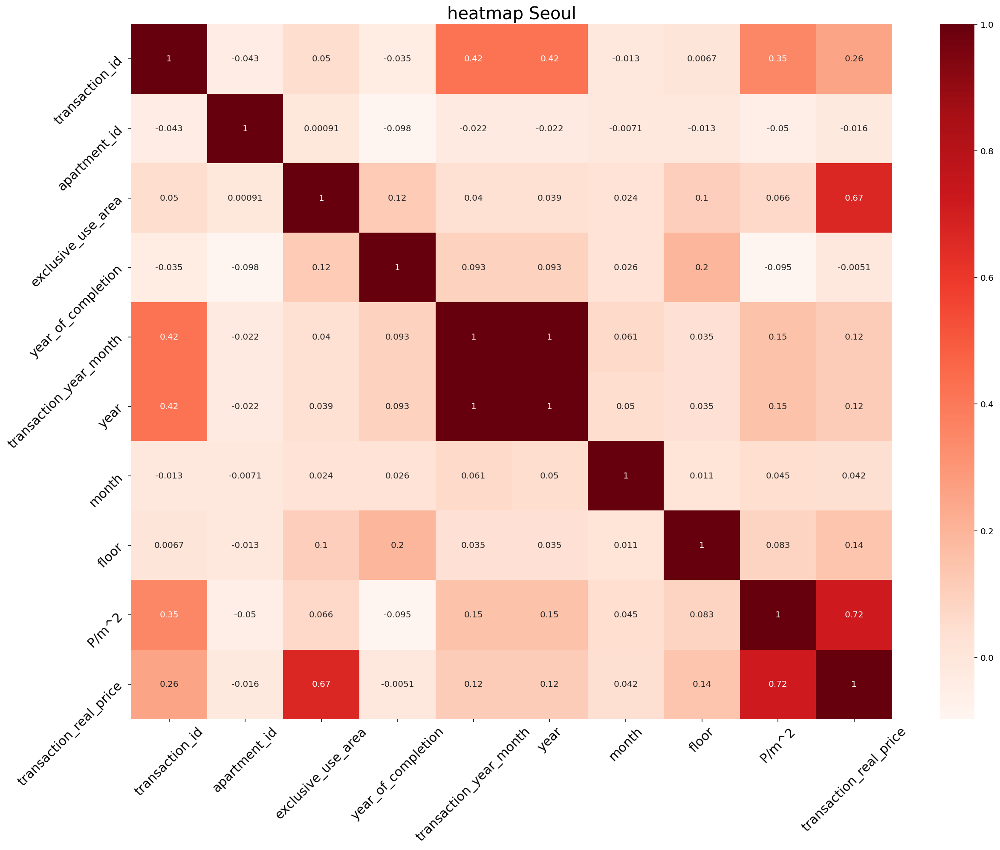

In [18]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

sns.heatmap(train[train['city'] == '서울특별시'].corr(), cmap="Reds", annot=True)
plt.title('heatmap Seoul', fontsize=20)
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.show()

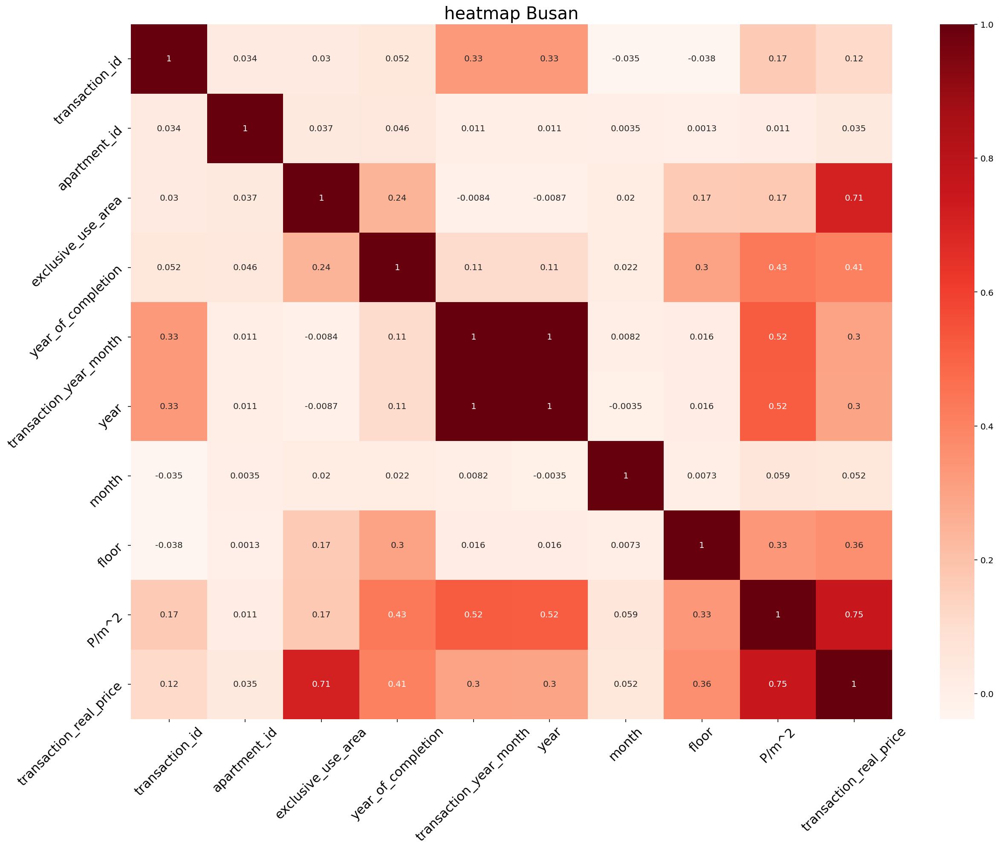

In [19]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

sns.heatmap(train[train['city'] == '부산광역시'].corr(), cmap="Reds", annot=True)
plt.title('heatmap Busan', fontsize=20)
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.show()

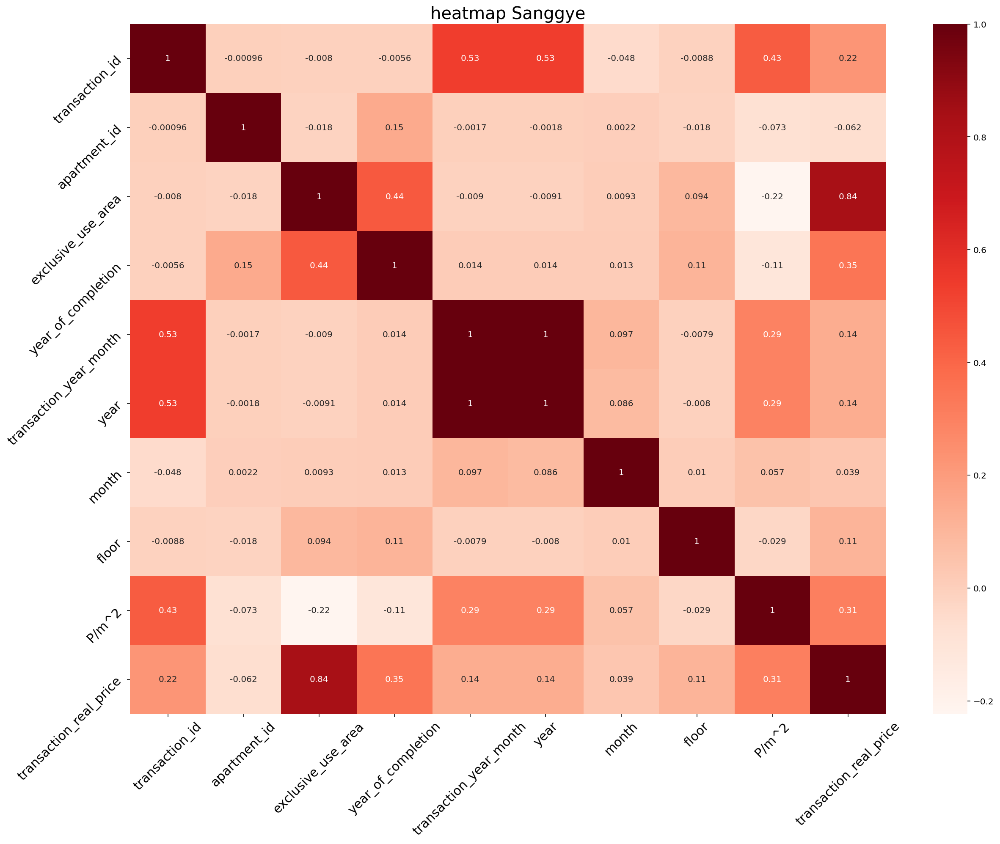

In [20]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

sns.heatmap(train[train['dong'] == '상계동'].corr(), cmap="Reds", annot=True)
plt.title('heatmap Sanggye', fontsize=20)
plt.xticks(rotation=45, fontsize=15)
plt.yticks(rotation=45, fontsize=15)
plt.show()

## 대략적 서울 집 값 분포를 확인해보자

In [ ]:
# 월별 거래량을 count로 정리해  max, min을 출력한다음, (max - min) / max 로 스케일링을 진행하였다,
# 어느 동의데이터가 거래량의 감소폭이 적고 꾸준한 거래량을 보이는 지역인지 확인을 하고 싶어서 데이터 변환을 진행하였다.
# 이 변환을 통해서 예상되는 결과는 
# 가설 : 대치동과 같이 꾸준히 거래가 되는 지역이 있을 것이다. 대치동은 교육열이 높은 곳으로 유사한 값이 나온 지역도 교육열이 높을 것이다.

In [29]:
df2 = train.groupby(["dong", "month"]).size().reset_index(name="Count")
df2 = df2.pivot("dong", "month", "Count")
df2.replace(np.NaN, 0, inplace=True)
list = []
for idx, idxn in zip(df2.index,range(len(df2.index))) :
    list.append( [idx, max(df2.loc[df2.index[idxn]]), min(df2.loc[df2.index[idxn]])])
list = pd.DataFrame(list)
list.columns = ['dong', 'max', 'min']
list['max-min'] = (list['max'] - list['min']) / list['max']
list_sort = list.sort_values(by=['max-min'], ascending=True).head(20)
list_sort

,dong,max,min,max-min
100,대치동,732.0,548.0,0.251366
404,천연동,68.0,50.0,0.264706
106,도곡동,620.0,441.0,0.288710
365,잠원동,816.0,576.0,0.294118
339,우동,1252.0,875.0,0.301118
382,정관읍 용수리,506.0,352.0,0.304348
23,광장동,441.0,304.0,0.310658
167,민락동,288.0,198.0,0.312500
233,서초동,1103.0,752.0,0.318223
338,용호동,1767.0,1203.0,0.319185


In [ ]:
# 결과를 확인해보니 대치동에서 max - min의 차이가 적은 것으로 확인 되었으며, 천연동은 서대문구에 위치하고 있으며 거래량이 적어 넘어 가도록 하겠습니다.
# 도곡동, 잠원동, 우동은 예상이 되는 지역이며 정관읍 용수리는 부산의 신도시로 신규아파트 입주로 인해 많은 거래가 있는 것으로 확인이 되었습니다.
# 전체 데이터 중 20의 데이터를 정렬해 확인해보았으며, 초기에 정해놓은 가설과 유사한 모습을 보였으며,
# 전통적으로 교육열이 높은 곳과 더불어 신도시가 거래량이 꾸준한 모습을 보였습니다.
# 해당 자료를 이용해 부동산 영업을 진행한다면 꾸준한 수익이 가능 할 것으로 보입니다.

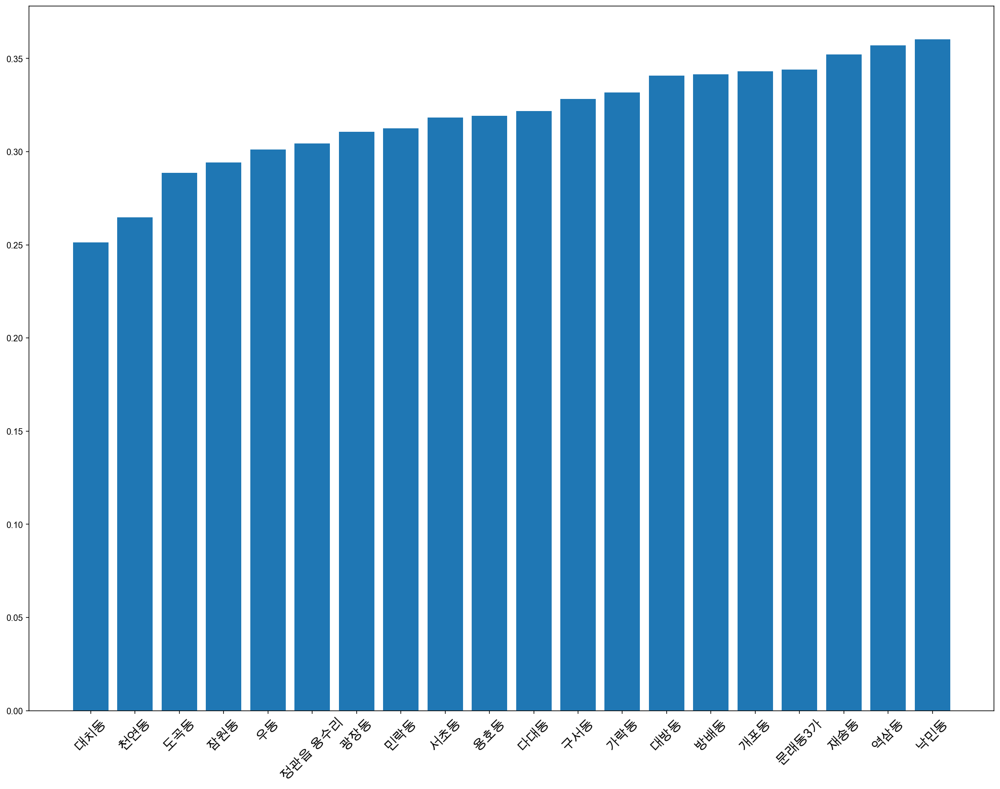

In [32]:
fig = plt.figure(figsize=(20, 15))
fig.set_facecolor('white')

plt.bar(list_sort['dong'], list_sort['max-min'])
plt.xticks(rotation=45, fontsize=15)

plt.show()

In [156]:
s_pivot = pd.pivot_table(df1, index=["city","dong"],values=["transaction_real_price"], aggfunc = ['mean','median','min','max','sum','count'])
s_pivot

mean                 median  \
           transaction_real_price transaction_real_price   
city  dong                                                 
부산광역시 가야동            20207.466579                19250.0   
      감만동            12522.813871                12025.0   
      감전동            13073.750000                13175.0   
      감천동            13898.350445                13700.0   
      개금동            16158.611128                14900.0   
...                           ...                    ...   
서울특별시 효창동            51399.878378                48000.0   
      후암동            49870.036496                45750.0   
      휘경동            34295.183976                34800.0   
      흑석동            63784.781627                64500.0   
      흥인동            74039.456432                79558.0   

                              min                    max  \
           transaction_real_price transaction_real_price   
city  dong                                                 
부산광역시 가야동                    2200                  52500   
      감만동                    1300                  33400   
      감전동                    6250                  25900   
      감천동                    1500                  34800   
      개금동                    2300                  59900   
...                           ...                    ...   
서울특별시 효창동                   14500                 123000   
      후암동                    8000                 120000   
      휘경동                    9091                  64500   
      흑석동                   16942                 294994   
      흥인동                   13600                 228977   

                              sum                  count  
           transaction_real_price transaction_real_price  
city  dong                                                
부산광역시 가야동                76485261                   3785  
      감만동                31958221                   2552  
      감전동                  522950                     40  
      감천동                34384519                   2474  
      개금동               162927276                  10083  
...                           ...                    ...  
서울특별시 효창동                22821546                    444  
      후암동                13664390                    274  
      휘경동                92459816                   2696  
      흑석동               163863104                   2569  
      흥인동                17843509                    241  

[477 rows x 6 columns]

In [157]:
seoul_count = s_pivot.xs('서울특별시')['mean']
seoul_count.sort_values(by="transaction_real_price",ascending=False).head(50)

,transaction_real_price
dong,
장충동1가,269888.888889
압구정동,164534.722914
청암동,161403.700000
용산동5가,153497.331633
회현동2가,139906.140351
반포동,132489.395651
한남동,122593.293264
서빙고동,116547.239777
대치동,116320.538909


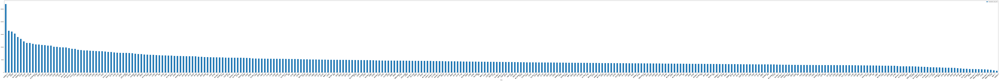

In [158]:
fig.set_facecolor('white')
seoul_count.sort_values(by="transaction_real_price",ascending=False).plot(kind='bar', figsize=(200,15))
fig.set_facecolor('white')
plt.xticks(rotation=45, fontsize=15)
plt.show()

In [159]:
busan_count = s_pivot.xs('부산광역시')['max']
busan_count.sort_values(by="transaction_real_price",ascending=False).head(50)

,transaction_real_price
dong,
우동,412787
재송동,220000
온천동,199330
남천동,179400
용호동,178350
범일동,177000
중동,166300
부전동,145000
민락동,132500


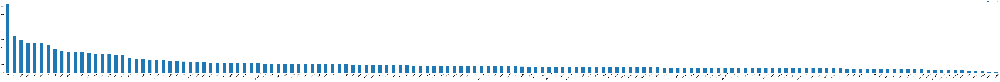

In [160]:
busan_count.sort_values(by="transaction_real_price",ascending=False).plot(kind='bar', figsize=(200,15))
plt.xticks(rotation=45, fontsize=15)
fig.set_facecolor('white')
plt.show()

No handles with labels found to put in legend.


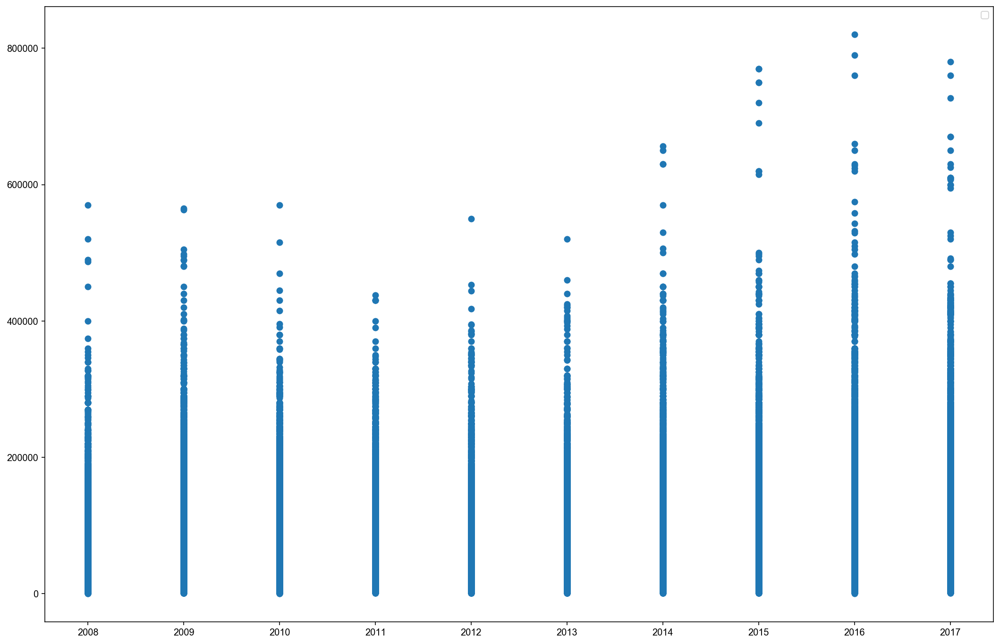

In [161]:
plt.figure(figsize=(18,12))
fig.set_facecolor('white')
plt.scatter(df1['year'],df1['transaction_real_price'])

plt.legend()
plt.show()

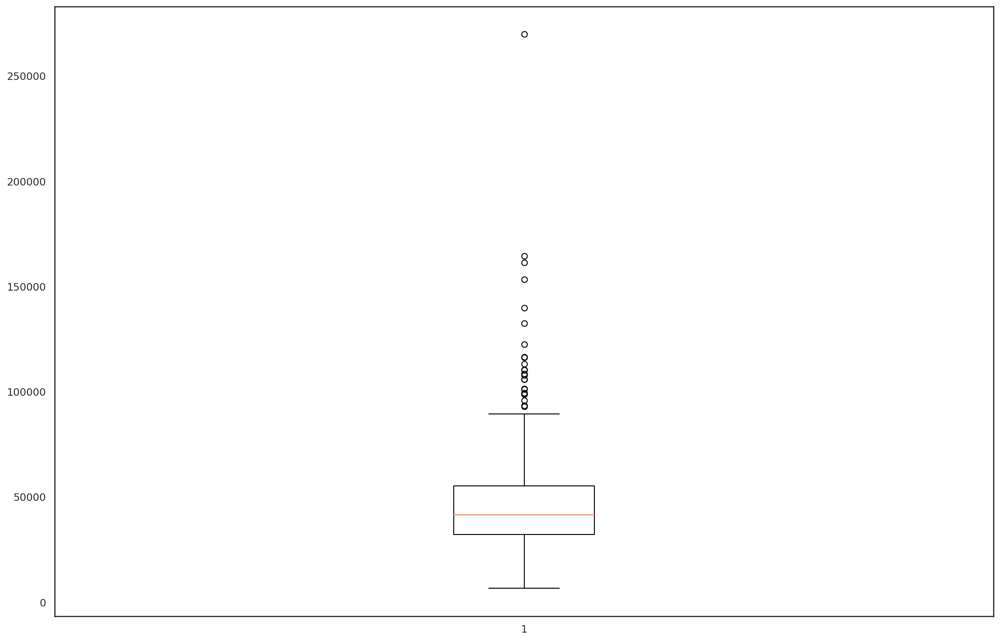

In [26]:
plt.figure(figsize=(18,12))
plt.boxplot(s_pivot.xs('서울특별시')["mean"])
plt.show()

 <img src="./datas/pieris.png" style="width:30%;">

## 동별 아파트 가격에 대한 대략적인 시각화

In [44]:
groupby_min = pd.DataFrame(df1.groupby("dong").transaction_real_price.min())
groupby_min.rename(columns={'transaction_real_price' : 'min'}, inplace=True)

In [45]:
groupby_max = pd.DataFrame(df1.groupby("dong").transaction_real_price.max())
groupby_max.rename(columns={'transaction_real_price' : 'max'}, inplace=True)

In [46]:
groupby_mean = pd.DataFrame(df1.groupby("dong").transaction_real_price.mean())
groupby_mean.rename(columns={'transaction_real_price' : 'mean'}, inplace=True)

In [47]:
groupby_std = pd.DataFrame(df1.groupby("dong").transaction_real_price.std())
groupby_std.rename(columns={'transaction_real_price' : 'std'}, inplace=True)

In [48]:
groupby_count = pd.DataFrame(df1.groupby("dong").transaction_real_price.count())

In [49]:
groupby_df1 = pd.concat([groupby_max, groupby_mean, groupby_min], axis=1)

In [50]:
groupby_df1['count'] = groupby_count

In [51]:
groupby_df1['Score_squareroot']=np.sqrt((groupby_df1['count']))

In [52]:
groupby_std = pd.DataFrame(df1.groupby("dong").transaction_real_price.std())
groupby_std.rename(columns={'transaction_real_price' : 'std'}, inplace=True)

In [53]:
groupby_df1['Score_squareroot']=np.sqrt((groupby_df1['count']))

In [54]:
groupby_df1 = pd.concat([groupby_max, groupby_mean, groupby_min, groupby_std], axis=1)

In [55]:
groupby_df1['sort'] = groupby_df1['max'] - groupby_df1['min']

In [56]:
groupby_count = pd.DataFrame(df1.groupby("dong").transaction_real_price.count())

In [57]:
groupby_df1['count'] = groupby_count
groupby_df1['Score_squareroot']=np.sqrt((groupby_df1['count']))

In [58]:
low = groupby_df1['mean'] - 1.96 * (groupby_df1['std']/(groupby_df1['Score_squareroot']))
high = groupby_df1['mean'] + 1.96 * (groupby_df1['std']/(groupby_df1['Score_squareroot']))

In [59]:
low_95 = pd.DataFrame(low)
high_95 = pd.DataFrame(high)

In [60]:
groupby_df1['low']=low_95
groupby_df1['high']=high_95

In [61]:
groupby_df1

,max,mean,min,std,sort,count,Score_squareroot,low,high
dong,,,,,,,,,
가락동,131500,54967.955681,1500,14630.303821,130000,9567,97.811042,54674.784329,55261.127033
가리봉동,32300,24241.186441,13000,3896.735630,19300,59,7.681146,23246.855375,25235.517506
가산동,58450,26812.244082,8889,9981.864532,49561,1225,35.000000,26253.259668,27371.228495
가야동,52500,20207.466579,2200,10164.129646,50300,3785,61.522354,19883.654291,20531.278867
가양동,115000,32263.930082,10000,14627.605091,105000,6622,81.375672,31911.612180,32616.247983
...,...,...,...,...,...,...,...,...,...
효창동,123000,51399.878378,14500,18028.839663,108500,444,21.071308,49722.881081,53076.875676
후암동,120000,49870.036496,8000,20119.032876,112000,274,16.552945,47487.783454,52252.289539
휘경동,64500,34295.183976,9091,10218.115117,55409,2696,51.923020,33909.468630,34680.899323


In [62]:
groupby_df1.sort_values(by = 'sort', inplace=True)

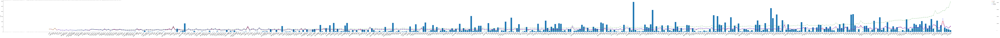

In [64]:
X = groupby_df1.index
y = groupby_df1

fig, ax1 = plt.subplots(figsize=(300,10))

fig.set_facecolor('white')

plt.xticks(rotation=45, fontsize=15)
ax1.set_xlabel('동')
ax1.set_ylabel('Count')
ax2 = ax1.twinx()
ax2.set_ylabel('Price')


ax2.plot(X, y['mean'],label='mean', color='r', marker='o',linewidth=3)
ax2.plot(X, y['max'], label='max', color='g', marker='*',linewidth=1)
ax2.plot(X, y['min'], label='min', color='g', marker='*',linewidth=1)
ax2.plot(X, y['low'], label='low_95%', color='b', marker='*',linewidth=1)
ax2.plot(X, y['high'], label='high_95%', color='b', marker='*',linewidth=1)
ax1.bar(X, y['count'])

plt.legend()

plt.show()

In [49]:
#신뢰구간 95%를 설정해 동별 가격을 보았을때 2곳에서 신뢰구간이 포함이 되지 않음을 발견했다.

In [50]:
groupby_df1.loc["주성동"].reset_index()

,index,주성동
0,max,117000.000000
1,mean,106000.000000
2,min,95000.000000
3,std,15556.349186
4,sort,22000.000000
5,count,2.000000
6,Score_squareroot,1.414214
7,low,84440.000000
8,high,127560.000000


In [51]:
(groupby_df1.loc["주성동"]['max'])-(groupby_df1.loc["주성동"]['min']) > (groupby_df1.loc["주성동"]['high'])-(groupby_df1.loc["주성동"]['low'])

False

In [52]:
groupby_df1.loc["교남동"].reset_index()

,index,교남동
0,max,124500.000000
1,mean,108600.000000
2,min,96500.000000
3,std,14381.585448
4,sort,28000.000000
5,count,3.000000
6,Score_squareroot,1.732051
7,low,92325.704030
8,high,124874.295970


In [53]:
(groupby_df1.loc["교남동"]['max'])-(groupby_df1.loc["교남동"]['min']) > (groupby_df1.loc["교남동"]['high'])-(groupby_df1.loc["교남동"]['low'])

False

In [41]:
meandata = train.groupby('dong').mean()
countdata = train.groupby('dong').count()
countdata = countdata['transaction_id'].rename('count')
countdata = pd.DataFrame(countdata)
meandata = pd.concat([meandata, countdata], axis=1)

In [42]:
meandata

,transaction_id,apartment_id,exclusive_use_area,year_of_completion,transaction_year_month,year,month,floor,P/m^2,transaction_real_price,count
dong,,,,,,,,,,,
가락동,647309.194627,4838.917320,67.629924,1991.382251,201302.942511,2012.965820,6.360510,7.630710,898.943953,54967.955681,9567
가리봉동,457230.084746,11849.254237,76.268475,1998.423729,201326.983051,2013.203390,6.644068,9.203390,319.878887,24241.186441,59
가산동,469902.710204,3908.305306,60.743495,2002.240000,201351.884898,2013.456327,6.252245,11.086531,562.429110,26812.244082,1225
가야동,743643.322589,5426.476618,81.036506,1995.665786,201254.728137,2012.482959,6.432232,8.428005,243.199671,20207.466579,3785
가양동,454446.522803,2194.682573,60.368251,1994.691332,201341.590607,2013.354123,6.178345,8.355029,543.557324,32263.930082,6622
...,...,...,...,...,...,...,...,...,...,...,...
효창동,146612.481982,10750.851351,87.116227,2001.051802,201365.923423,2013.601351,5.788288,6.819820,616.034638,51399.878378,444
후암동,123478.627737,9103.759124,89.719964,1993.978102,201288.565693,2012.821168,6.448905,3.251825,569.887120,49870.036496,274
휘경동,174219.989985,8473.300445,74.881195,2002.077151,201321.750000,2013.156528,6.097181,10.411350,464.836993,34295.183976,2696


In [43]:
meandata.drop(['transaction_id', 'apartment_id', 'transaction_year_month'], axis=1, inplace=True)

In [44]:
meandata

,exclusive_use_area,year_of_completion,year,month,floor,P/m^2,transaction_real_price,count
dong,,,,,,,,
가락동,67.629924,1991.382251,2012.965820,6.360510,7.630710,898.943953,54967.955681,9567
가리봉동,76.268475,1998.423729,2013.203390,6.644068,9.203390,319.878887,24241.186441,59
가산동,60.743495,2002.240000,2013.456327,6.252245,11.086531,562.429110,26812.244082,1225
가야동,81.036506,1995.665786,2012.482959,6.432232,8.428005,243.199671,20207.466579,3785
가양동,60.368251,1994.691332,2013.354123,6.178345,8.355029,543.557324,32263.930082,6622
...,...,...,...,...,...,...,...,...
효창동,87.116227,2001.051802,2013.601351,5.788288,6.819820,616.034638,51399.878378,444
후암동,89.719964,1993.978102,2012.821168,6.448905,3.251825,569.887120,49870.036496,274
휘경동,74.881195,2002.077151,2013.156528,6.097181,10.411350,464.836993,34295.183976,2696


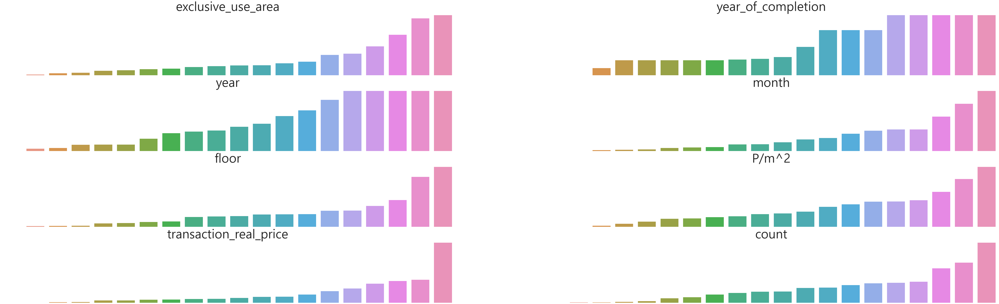

In [47]:
plt.figure(figsize=(100, 30))

for idx, data in zip(range(len(meandata.columns)) , meandata.columns):
    plt.subplot(4, 2, idx+1)
    a = meandata[data].sort_values().tail(20)
    a = (a-min(a.values)) / (max(a.values) - min(a.values))
    sns.barplot(x=a.index, y= a.values);
    plt.title(data, fontsize = 70)
    plt.axis('off')

plt.show()

# 새로운 변수를 추가해보자

## 공원 Data

In [54]:
park.tail() #train data와  park data는 시와 동을 엮어 분석을 진행할 예정이다.

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
1354,서울특별시,구로구,천왕동,이펜시아어린이공원,어린이공원,1500.0,NaN,조합놀이 1기,NaN,NaN,NaN,2006.0,2019-02-25
1355,서울특별시,구로구,천왕동,개명소공원,소공원,5415.0,NaN,NaN,NaN,NaN,NaN,2006.0,2019-02-25
1356,서울특별시,구로구,천왕동,봉화대근린공원,근린공원,60975.0,NaN,NaN,NaN,NaN,NaN,2006.0,2019-02-25
1357,서울특별시,구로구,항동,푸른수목원,근린공원,100809.0,NaN,NaN,NaN,NaN,NaN,2005.0,2019-02-25
1358,서울특별시,구로구,오류동,오류동역문화공원,문화공원,7510.0,NaN,NaN,NaN,NaN,NaN,2013.0,2019-02-25


In [55]:
park.info() # 공원 Datad에 null 값이 많다. 대략적으로 보니 각 공원별로 장비의 유무를 나타내는 것 같다

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1359 entries, 0 to 1358
Data columns (total 13 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   city                         1359 non-null   object 
 1   gu                           1356 non-null   object 
 2   dong                         1359 non-null   object 
 3   park_name                    1359 non-null   object 
 4   park_type                    1359 non-null   object 
 5   park_area                    1359 non-null   float64
 6   park_exercise_facility       277 non-null    object 
 7   park_entertainment_facility  435 non-null    object 
 8   park_benefit_facility        266 non-null    object 
 9   park_cultural_facitiy        72 non-null     object 
 10  park_facility_other          175 non-null    object 
 11  park_open_year               937 non-null    float64
 12  reference_date               1359 non-null   object 
dtypes: float64(2), obj

In [56]:
park_df = pd.DataFrame(park, columns=["city","gu","dong","park_name","park_type","park_area","park_exercise_facility",
                                      "park_entertainment_facility","park_benefit_facility","park_cultural_facitiy","park_facility_other","park_open_year","reference_date"])
park_df.tail()

,city,gu,dong,park_name,park_type,park_area,park_exercise_facility,park_entertainment_facility,park_benefit_facility,park_cultural_facitiy,park_facility_other,park_open_year,reference_date
1354,서울특별시,구로구,천왕동,이펜시아어린이공원,어린이공원,1500.0,NaN,조합놀이 1기,NaN,NaN,NaN,2006.0,2019-02-25
1355,서울특별시,구로구,천왕동,개명소공원,소공원,5415.0,NaN,NaN,NaN,NaN,NaN,2006.0,2019-02-25
1356,서울특별시,구로구,천왕동,봉화대근린공원,근린공원,60975.0,NaN,NaN,NaN,NaN,NaN,2006.0,2019-02-25
1357,서울특별시,구로구,항동,푸른수목원,근린공원,100809.0,NaN,NaN,NaN,NaN,NaN,2005.0,2019-02-25
1358,서울특별시,구로구,오류동,오류동역문화공원,문화공원,7510.0,NaN,NaN,NaN,NaN,NaN,2013.0,2019-02-25


In [57]:
park_rank = (park_df.groupby('dong')['park_area'].agg(['sum'])).sort_values(by='sum', ascending=False)
park_rank.head(10)

,sum
dong,
초읍동,9956116.3
상계동,6692795.0
온천동,6346071.7
중계동,5334267.0
영주동,5249896.0
진관동,2956693.3
면목동,2801845.8
장전동,2332959.4
서대신동3가,2104835.0


In [58]:
# 새로운 x 값이 생겼다. 집값과의 상관관계를 밝혀보자

In [59]:
pd.pivot_table(park_df, index='dong',aggfunc="sum")[['park_area']].reset_index()

,dong,park_area
0,가락동,102882.4
1,가산동,3650.6
2,가야동,72762.0
3,가양동,228304.5
4,갈현동,8312.8
...,...,...
232,회동동,9189.2
233,효창동,171802.0
234,후암동,2522.0
235,휘경동,6965.9


In [60]:
park_count = park_df.groupby(['dong'])["park_area"].count().reset_index()

In [61]:
corr_park_count = pd.merge(park_count, df1)

In [62]:
park_sum = pd.merge(pd.pivot_table(park_df, index='dong')[['park_area']].reset_index(), df1)

In [110]:
# 동별 공원의 넓이 합과 집값의 상관관계를 보자

In [63]:
np.corrcoef(park_sum['park_area'], park_sum['transaction_real_price'])[0,1]

-0.074567797760041

In [111]:
# 동별 공원의 수와 집값의 상관관계를 보자

In [64]:
np.corrcoef(corr_park_count['park_area'], corr_park_count['transaction_real_price'])[0,1]

0.09527464647645059

# 회귀분석을 해보자

## 지금까지의 회귀분석 모델의 결과
 - x1 : exclusive_use_area, x2 : year_of_completion, x3 : floor,
    - score =  0.3194554604195421
    - Mean_Squared_Error =  656071224.025548
    - RMSE =  25613.88732749381

 - x1 : exclusive_use_area, x2 : year_of_completion, x3 : floor, x4 : dong
    - score =  0.753000279857136
    - Mean_Squared_Error =  238117271.24869266
    - RMSE =  15431.04893546426

In [10]:
from sklearn import linear_model
import StrReg

## 계산해보자

### Train 데이터만으로 계산 
 - 계속 반복되는 계산을 클래스로 만들었다.

In [11]:
train = pd.read_csv('datas/train.csv')

In [12]:
train.head(1)

,transaction_id,apartment_id,city,dong,jibun,apt,addr_kr,exclusive_use_area,year_of_completion,transaction_year_month,transaction_date,floor,transaction_real_price
0,0,7622,서울특별시,신교동,6-13,신현(101동),신교동 6-13 신현(101동),84.82,2002,200801,21~31,2,37500


In [13]:
reg = StrReg.StrReg()

In [14]:
reg.linear_regression_fit(['exclusive_use_area', 'floor'], ['dong', 'apartment_id'], 'transaction_real_price', train)

LinearRegression()

In [15]:
prediction = reg.linear_regression_predict(train)

In [16]:
y = train['transaction_real_price']

In [17]:
residuals = y-prediction
residuals.describe()

count    1.216553e+06
mean     5.015362e-11
std      1.054340e+04
min     -2.164255e+05
25%     -4.503529e+03
50%     -1.998651e+02
75%      3.897433e+03
max      4.870099e+05
Name: transaction_real_price, dtype: float64

In [18]:
SSE = (residuals**2).sum()
SST = ((y-y.mean())**2).sum()
R_squared = 1 - (SSE/SST)
print('R_squared = ', R_squared)

R_squared =  0.884690081565853


In [19]:
from sklearn.metrics import mean_squared_error
print('score = ', R_squared)
print('Mean_Squared_Error = ', mean_squared_error(prediction, y))
print('RMSE = ', mean_squared_error(prediction, y)**0.5)

score =  0.884690081565853
Mean_Squared_Error =  111163215.5273989
RMSE =  10543.396773687258


In [20]:
linear_regression = reg.linear_regression_fit(['exclusive_use_area', 'floor'], ['dong', 'apartment_id'], 'transaction_real_price', train, True)

In [21]:
prediction = reg.linear_regression_predict(train)

In [22]:
y = train['transaction_real_price']

In [23]:
residuals = y-prediction
residuals.describe()

count    1.216553e+06
mean     8.711762e-12
std      1.256274e+04
min     -1.281950e+05
25%     -4.565783e+03
50%     -1.209431e+02
75%      4.623889e+03
max      5.977518e+05
Name: transaction_real_price, dtype: float64

In [24]:
SSE = (residuals**2).sum()
SST = ((y-y.mean())**2).sum()
R_squared = 1 - (SSE/SST)
print('R_squared = ', R_squared)

R_squared =  0.8362905578787407


In [25]:
from sklearn.metrics import mean_squared_error
print('score = ', R_squared)
print('Mean_Squared_Error = ', mean_squared_error(prediction, y))
print('RMSE = ', mean_squared_error(prediction, y)**0.5)

score =  0.8362905578787407
Mean_Squared_Error =  157822225.92403314
RMSE =  12562.73162668188


In [26]:
reg.linear_regression_fit(['exclusive_use_area', 'floor'], ['dong', 'apartment_id', 'transaction_year_month'], 'transaction_real_price', train)

LinearRegression()

In [ ]:
prediction = reg.linear_regression_predict(train)

In [ ]:
y = train['transaction_real_price']

In [ ]:
residuals = y-prediction
residuals.describe()

In [ ]:
SSE = (residuals**2).sum()
SST = ((y-y.mean())**2).sum()
R_squared = 1 - (SSE/SST)
print('R_squared = ', R_squared)

In [ ]:
from sklearn.metrics import mean_squared_error
print('score = ', R_squared)
print('Mean_Squared_Error = ', mean_squared_error(prediction, y))
print('RMSE = ', mean_squared_error(prediction, y)**0.5)

In [ ]:
reg.linear_regression_fit(['exclusive_use_area', 'floor'], ['dong', 'apartment_id', 'transaction_year_month'], 'transaction_real_price', train, 'exclusive_use_area')

In [ ]:
prediction = reg.linear_regression_predict(train)

In [ ]:
y = train['transaction_real_price']

In [ ]:
residuals = y-prediction
residuals.describe()

In [ ]:
SSE = (residuals**2).sum()
SST = ((y-y.mean())**2).sum()
R_squared = 1 - (SSE/SST)
print('R_squared = ', R_squared)

In [ ]:
from sklearn.metrics import mean_squared_error
print('score = ', R_squared)
print('Mean_Squared_Error = ', mean_squared_error(prediction, y))
print('RMSE = ', mean_squared_error(prediction, y)**0.5)

### Park데이터 추가

In [96]:
park_df = pd.DataFrame(pd.read_csv('datas/park.csv'))

In [97]:
area = pd.pivot_table(park_df, index='dong',aggfunc="sum")[['park_area']].reset_index()

In [98]:
count = pd.pivot_table(park_df, index='dong',aggfunc="count")[['park_area']].reset_index()

In [99]:
count.rename(columns={'park_area' : 'park_count'}, inplace=True)

In [100]:
park_df = pd.merge(area, count)

In [101]:
train = pd.merge(train ,park_df)

In [102]:
train.head(1)

,transaction_id,apartment_id,city,dong,jibun,apt,addr_kr,exclusive_use_area,year_of_completion,transaction_year_month,transaction_date,floor,transaction_real_price,park_area,park_count
0,11,7808,서울특별시,명륜1가,45-5,아마레스,명륜1가 45-5 아마레스,84.59,2002,200801,1~10,1,30400,1149.5,1


In [103]:
reg.linear_regression_fit(['exclusive_use_area', 'floor', 'park_area', 'park_count'], ['dong', 'apartment_id', 'transaction_year_month'], 'transaction_real_price', train)

LinearRegression()

In [104]:
prediction = reg.linear_regression_predict(train)

In [105]:
y = train['transaction_real_price']

In [106]:
residuals = y-prediction
residuals.describe()

count    9.525760e+05
mean    -4.143787e-12
std      1.040958e+04
min     -1.878745e+05
25%     -3.876777e+03
50%     -1.527318e+02
75%      3.457916e+03
max      5.125607e+05
Name: transaction_real_price, dtype: float64

In [107]:
SSE = (residuals**2).sum()
SST = ((y-y.mean())**2).sum()
R_squared = 1 - (SSE/SST)
print('R_squared = ', R_squared)

R_squared =  0.9003701677303142


In [108]:
from sklearn.metrics import mean_squared_error
print('score = ', R_squared)
print('Mean_Squared_Error = ', mean_squared_error(prediction, y))
print('RMSE = ', mean_squared_error(prediction, y)**0.5)

score =  0.9003701677303142
Mean_Squared_Error =  108359138.68998289
RMSE =  10409.569572752895


 <img src="./datas/dacon.png" style="width:150%;">

# 이후 목표

 <img src="./datas/csv.png" style="width:100%;">

 <img src="./datas/sgis.png" style="width:100%;">

 <img src="./datas/sdc.png" style="width:100%;">

 <img src="./datas/bdc.png" style="width:100%;">

In [1]:
main = pd.read_csv('./datas/years.csv')
main

,city,dong,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017
0,부산광역시,가야동,1.865851,1.376505,1.301118,1.226142,1.312581,1.182113,1.147417,1.099158,1.063505,1.0
1,부산광역시,감만동,2.332180,2.278583,1.850358,1.396727,1.407425,1.340416,1.310642,1.232791,1.127871,1.0
2,부산광역시,감전동,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,부산광역시,감천동,1.717855,1.593846,1.398639,1.180147,1.126194,1.079936,1.009072,1.024593,1.047879,1.0
4,부산광역시,개금동,1.814874,1.604285,1.372255,1.162673,1.129391,1.059517,1.038818,1.046485,1.069894,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
472,서울특별시,효창동,1.208662,1.092417,1.089090,0.953734,1.115925,1.229213,1.199871,1.075827,1.003975,1.0
473,서울특별시,후암동,1.414844,1.450965,1.030360,1.143414,1.340436,1.467187,1.239904,1.161088,1.232522,1.0
474,서울특별시,휘경동,1.424191,1.385040,1.230830,1.300896,1.282179,1.291042,1.228048,1.132371,1.052524,1.0
475,서울특별시,흑석동,1.508360,1.285152,1.152674,1.304433,1.232938,1.280612,1.370193,1.278084,1.146362,1.0


In [33]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1216553 entries, 0 to 1216552
Data columns (total 16 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   city                    1216553 non-null  object 
 1   dong                    1216553 non-null  object 
 2   transaction_real_price  1216553 non-null  int64  
 3   transaction_id          1216553 non-null  int64  
 4   apartment_id            1216553 non-null  int64  
 5   jibun                   1216553 non-null  object 
 6   apt                     1216553 non-null  object 
 7   addr_kr                 1216553 non-null  object 
 8   exclusive_use_area      1216553 non-null  float64
 9   year_of_completion      1216553 non-null  int64  
 10  transaction_year_month  1216553 non-null  int64  
 11  year                    1216553 non-null  float64
 12  month                   1216553 non-null  int64  
 13  transaction_date        1216553 non-null  object 
 14  fl

In [32]:
df1.describe()

,transaction_real_price,transaction_id,apartment_id,exclusive_use_area,year_of_completion,transaction_year_month,year,month,floor,P/m^2
count,1.216553e+06,1.216553e+06,1.216553e+06,1.216553e+06,1.216553e+06,1.216553e+06,1.216553e+06,1.216553e+06,1.216553e+06,1.216553e+06
mean,3.822769e+04,6.091530e+05,6.299685e+03,7.816549e+01,1.998297e+03,2.012984e+05,2.012921e+03,6.324183e+00,9.343291e+00,4.826782e+02
std,3.104898e+04,3.526198e+05,3.581169e+03,2.915113e+01,8.941347e+00,2.905732e+02,2.904727e+00,3.297408e+00,6.606500e+00,2.965007e+02
min,1.000000e+02,0.000000e+00,0.000000e+00,9.260000e+00,1.961000e+03,2.008010e+05,2.008000e+03,1.000000e+00,-4.000000e+00,7.233273e-01
25%,1.900000e+04,3.041380e+05,3.345000e+03,5.976000e+01,1.993000e+03,2.010100e+05,2.010000e+03,3.000000e+00,4.000000e+00,2.803832e+02
50%,3.090000e+04,6.082760e+05,5.964000e+03,8.241000e+01,1.999000e+03,2.013120e+05,2.013000e+03,6.000000e+00,8.000000e+00,4.219409e+02
75%,4.700000e+04,9.124140e+05,9.436000e+03,8.497000e+01,2.005000e+03,2.015110e+05,2.015000e+03,9.000000e+00,1.300000e+01,5.908822e+02
max,8.200000e+05,1.234827e+06,1.265800e+04,4.243200e+02,2.017000e+03,2.017110e+05,2.017000e+03,1.200000e+01,8.000000e+01,4.510304e+03


In [36]:
import pandas_profiling as pp

In [37]:
train.profile_report()

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]